In [129]:
'''
Problem Defination
Determining whether or not the water is suitable for drinking is difficult due to the multiple factors that influence
the water's quality.This motivated us to assess factors affecting the quality of water and create models with
different machine learning algorithms that can accurately classifies its quality.

Datasets
1) Dataset used in the project represents approximately 8000 samples of water in an urban environment, with
their individual concentration of Different elements such as the concentration of dissolved oxygen, bacteria
levels, the amount of salt (or salinity), or the amount of material suspended in the water (turbidity).
2) The data set has 21 different columns representing the concentration of different elements and
approximately 8000 rows.
3) The Dependent variable is named as column "is_safe" which has 2 classes in the data, both in the training
and testing sets:
4) Class 0 represents water that is NOT suitable
5) Class 1 represents water that is suitable
'''

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


In [1]:
#Data Loading
import pandas as pd
from pandas import read_csv
data=read_csv("D:\\semister 5\\machine learning\\PROJECT\\1.csv")
data

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
0,1.65,9.08,0.04,2.85,0.007,0.35,0.83,0.17,0.05,0.20,...,0.054,16.08,1.13,0.007,37.75,6.78,0.08,0.34,0.02,1
1,2.32,21.16,0.01,3.31,0.002,5.28,0.68,0.66,0.90,0.65,...,0.100,2.01,1.93,0.003,32.26,3.21,0.08,0.27,0.05,1
2,1.01,14.02,0.04,0.58,0.008,4.24,0.53,0.02,0.99,0.05,...,0.078,14.16,1.11,0.006,50.28,7.07,0.07,0.44,0.01,0
3,1.36,11.33,0.04,2.96,0.001,7.23,0.03,1.66,1.08,0.71,...,0.016,1.41,1.29,0.004,9.12,1.72,0.02,0.45,0.05,1
4,0.92,24.33,0.03,0.20,0.006,2.67,0.69,0.57,0.61,0.13,...,0.117,6.74,1.11,0.003,16.90,2.41,0.02,0.06,0.02,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7994,0.05,7.78,0.00,1.95,0.040,0.10,0.03,0.03,1.37,0.00,...,0.197,14.29,1.00,0.005,3.57,2.13,0.09,0.06,0.03,1
7995,0.05,24.22,0.02,0.59,0.010,0.45,0.02,0.02,1.48,0.00,...,0.031,10.27,1.00,0.001,1.48,1.11,0.09,0.10,0.08,1
7996,0.09,6.85,0.00,0.61,0.030,0.05,0.05,0.02,0.91,0.00,...,0.182,15.92,1.00,0.000,1.35,4.84,0.00,0.04,0.05,1
7997,0.01,10,0.01,2.00,0.000,2.00,0.00,0.09,0.00,0.00,...,0.000,0.00,0.00,0.000,0.00,0.00,0.00,0.00,0.00,1


In [130]:
print(data.head())
colnames=['aluminium','ammonia','arsenic','barium','cadmium','chloramine','chromium','copper','flouride','bacteria',
          'viruses','lead','nitrates','nitrites','mercury','perchlorate','radium','selenium','silver','uranium','is_safe']
print(data.shape)

   aluminium ammonia  arsenic  barium  cadmium  chloramine  chromium  copper  \
0       1.65    9.08     0.04    2.85    0.007        0.35      0.83    0.17   
1       2.32   21.16     0.01    3.31    0.002        5.28      0.68    0.66   
2       1.01   14.02     0.04    0.58    0.008        4.24      0.53    0.02   
3       1.36   11.33     0.04    2.96    0.001        7.23      0.03    1.66   
4       0.92   24.33     0.03    0.20    0.006        2.67      0.69    0.57   

   flouride  bacteria  ...   lead  nitrates  nitrites  mercury  perchlorate  \
0      0.05      0.20  ...  0.054     16.08      1.13    0.007        37.75   
1      0.90      0.65  ...  0.100      2.01      1.93    0.003        32.26   
2      0.99      0.05  ...  0.078     14.16      1.11    0.006        50.28   
3      1.08      0.71  ...  0.016      1.41      1.29    0.004         9.12   
4      0.61      0.13  ...  0.117      6.74      1.11    0.003        16.90   

   radium  selenium  silver  uranium  is_saf

In [131]:
# Converting Attributes to float and Removing NAN Values.
indexNames=data[data['ammonia']=='#NUM!'].index
data.drop(indexNames,inplace=True)
v1=lambda x:float(x)
data.ammonia=data.ammonia.apply(v1)
indexNames=data[data['is_safe']=='#NUM!'].index
data.drop(indexNames,inplace=True)
data.is_safe=data.is_safe.apply(v1)
data.dtypes


aluminium      float64
ammonia        float64
arsenic        float64
barium         float64
cadmium        float64
chloramine     float64
chromium       float64
copper         float64
flouride       float64
bacteria       float64
viruses        float64
lead           float64
nitrates       float64
nitrites       float64
mercury        float64
perchlorate    float64
radium         float64
selenium       float64
silver         float64
uranium        float64
is_safe        float64
dtype: object

In [132]:
# Feature Selection With Univariate Selection
data.corr()

,aluminium,ammonia,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,...,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
aluminium,1.000000,0.067369,0.225725,0.294091,-0.099902,0.369221,0.353134,0.168569,-0.009877,-0.078324,...,0.020957,-0.003851,0.237439,-0.003129,0.362986,0.243396,-0.003651,0.334923,0.014723,0.333974
ammonia,0.067369,1.000000,0.046783,0.070099,-0.006422,0.104775,0.124782,0.015953,-0.028221,0.063603,...,-0.037065,0.006483,-0.063309,0.020884,0.090928,0.050401,0.029897,0.075547,0.014635,-0.022919
arsenic,0.225725,0.046783,1.000000,0.362925,0.334782,0.356509,0.312421,-0.036488,0.003731,0.035642,...,-0.087669,0.027533,0.305113,-0.015288,0.332228,0.218328,-0.006993,0.307794,0.001469,-0.123362
barium,0.294091,0.070099,0.362925,1.000000,-0.037901,0.446869,0.415937,0.065277,-0.018637,0.101304,...,-0.042829,-0.011423,0.312783,0.006165,0.462207,0.286890,0.035222,0.431542,-0.002541,0.090858
cadmium,-0.099902,-0.006422,0.334782,-0.037901,1.000000,-0.144366,-0.157716,-0.109252,0.005005,-0.092133,...,-0.035313,0.020232,-0.015829,-0.016169,-0.149269,-0.098936,0.009933,-0.155441,-0.005911,-0.256034
chloramine,0.369221,0.104775,0.356509,0.446869,-0.144366,1.000000,0.555846,0.118975,0.004254,0.154443,...,-0.030241,-0.001619,0.379916,-0.021198,0.588683,0.389119,0.011435,0.522372,-0.007648,0.186704
chromium,0.353134,0.124782,0.312421,0.415937,-0.157716,0.555846,1.000000,0.113003,-0.002424,0.141937,...,-0.050254,-0.012843,0.335940,-0.022541,0.524432,0.315484,0.030598,0.510705,-0.005472,0.182306
copper,0.168569,0.015953,-0.036488,0.065277,-0.109252,0.118975,0.113003,1.000000,0.011647,0.149271,...,0.121762,0.002259,0.162092,0.017785,0.104527,0.026534,-0.003356,0.089241,0.006802,0.029498
flouride,-0.009877,-0.028221,0.003731,-0.018637,0.005005,0.004254,-0.002424,0.011647,1.000000,0.013984,...,0.012146,-0.008245,-0.016591,-0.004263,-0.016352,0.007683,0.022726,0.014446,0.016849,0.006550
bacteria,-0.078324,0.063603,0.035642,0.101304,-0.092133,0.154443,0.141937,0.149271,0.013984,1.000000,...,-0.027179,-0.033993,0.246463,-0.004406,0.147526,0.099080,-0.006779,0.148199,0.045077,-0.022077


In [133]:
data.drop(["ammonia"], axis = 1, inplace = True)
data.describe()


,aluminium,arsenic,barium,cadmium,chloramine,chromium,copper,flouride,bacteria,viruses,lead,nitrates,nitrites,mercury,perchlorate,radium,selenium,silver,uranium,is_safe
count,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000,7996.000000
mean,0.666396,0.161477,1.567928,0.042803,2.177589,0.247300,0.805940,0.771646,0.319714,0.328706,0.099431,9.819250,1.329846,0.005193,16.465266,2.920106,0.049684,0.147811,0.044672,0.114057
std,1.265323,0.252632,1.216227,0.036049,2.567210,0.270663,0.653595,0.435423,0.329497,0.378113,0.058169,5.541977,0.573271,0.002967,17.688827,2.322805,0.028773,0.143569,0.026906,0.317900
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040000,0.030000,0.560000,0.008000,0.100000,0.050000,0.090000,0.407500,0.000000,0.002000,0.048000,5.000000,1.000000,0.003000,2.170000,0.820000,0.020000,0.040000,0.020000,0.000000
50%,0.070000,0.050000,1.190000,0.040000,0.530000,0.090000,0.750000,0.770000,0.220000,0.008000,0.102000,9.930000,1.420000,0.005000,7.745000,2.410000,0.050000,0.080000,0.050000,0.000000
75%,0.280000,0.100000,2.482500,0.070000,4.240000,0.440000,1.390000,1.160000,0.610000,0.700000,0.151000,14.610000,1.760000,0.008000,29.487500,4.670000,0.070000,0.240000,0.070000,0.000000
max,5.050000,1.050000,4.940000,0.130000,8.680000,0.900000,2.000000,1.500000,1.000000,1.000000,0.200000,19.830000,2.930000,0.010000,60.010000,7.990000,0.100000,0.500000,0.090000,1.000000


In [134]:
import numpy as np
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
X = data.iloc[:,0:19]
Y = data.iloc[:,-1]
bestfeatures = SelectKBest(score_func=chi2, k=10)
fit = bestfeatures.fit(X,Y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)
featureScores = pd.concat([dfcolumns,dfscores],axis =1)
featureScores.columns = ['Feature','Score']
featureScores



,Feature,Score
0,aluminium,2142.465724
1,arsenic,48.089352
2,barium,62.266278
3,cadmium,15.912158
4,chloramine,843.478997
5,chromium,78.714917
6,copper,3.687476
7,flouride,0.084283
8,bacteria,1.323293
9,viruses,32.745693


In [135]:
print(featureScores.nlargest(10,'Score'))
data.drop(['copper','flouride','bacteria','lead','nitrates','mercury','selenium','silver'
,'uranium'], axis = 1, inplace = True)


        Feature        Score
0     aluminium  2142.465724
14  perchlorate   871.457594
4    chloramine   843.478997
11     nitrates   130.000691
5      chromium    78.714917
2        barium    62.266278
15       radium    61.920504
1       arsenic    48.089352
9       viruses    32.745693
3       cadmium    15.912158


In [136]:
# Summarizing the Dataset
print(data.shape)
print(data.groupby('is_safe').size())
print(data.describe())

(7996, 11)
is_safe
0.0    7084
1.0     912
dtype: int64
         aluminium      arsenic       barium      cadmium   chloramine  \
count  7996.000000  7996.000000  7996.000000  7996.000000  7996.000000   
mean      0.666396     0.161477     1.567928     0.042803     2.177589   
std       1.265323     0.252632     1.216227     0.036049     2.567210   
min       0.000000     0.000000     0.000000     0.000000     0.000000   
25%       0.040000     0.030000     0.560000     0.008000     0.100000   
50%       0.070000     0.050000     1.190000     0.040000     0.530000   
75%       0.280000     0.100000     2.482500     0.070000     4.240000   
max       5.050000     1.050000     4.940000     0.130000     8.680000   

          chromium      viruses     nitrites  perchlorate       radium  \
count  7996.000000  7996.000000  7996.000000  7996.000000  7996.000000   
mean      0.247300     0.328706     1.329846    16.465266     2.920106   
std       0.270663     0.378113     0.573271    17.6888

In [137]:
data.corr()


,aluminium,arsenic,barium,cadmium,chloramine,chromium,viruses,nitrites,perchlorate,radium,is_safe
aluminium,1.000000,0.225725,0.294091,-0.099902,0.369221,0.353134,-0.071040,0.237439,0.362986,0.243396,0.333974
arsenic,0.225725,1.000000,0.362925,0.334782,0.356509,0.312421,0.011596,0.305113,0.332228,0.218328,-0.123362
barium,0.294091,0.362925,1.000000,-0.037901,0.446869,0.415937,-0.002429,0.312783,0.462207,0.286890,0.090858
cadmium,-0.099902,0.334782,-0.037901,1.000000,-0.144366,-0.157716,0.021255,-0.015829,-0.149269,-0.098936,-0.256034
chloramine,0.369221,0.356509,0.446869,-0.144366,1.000000,0.555846,0.003432,0.379916,0.588683,0.389119,0.186704
chromium,0.353134,0.312421,0.415937,-0.157716,0.555846,1.000000,0.002193,0.335940,0.524432,0.315484,0.182306
viruses,-0.071040,0.011596,-0.002429,0.021255,0.003432,0.002193,1.000000,-0.091364,0.002965,-0.019955,-0.097040
nitrites,0.237439,0.305113,0.312783,-0.015829,0.379916,0.335940,-0.091364,1.000000,0.346407,0.272939,0.046986
perchlorate,0.362986,0.332228,0.462207,-0.149269,0.588683,0.524432,0.002965,0.346407,1.000000,0.373242,0.075735
radium,0.243396,0.218328,0.286890,-0.098936,0.389119,0.315484,-0.019955,0.272939,0.373242,1.000000,0.064743


<AxesSubplot:>

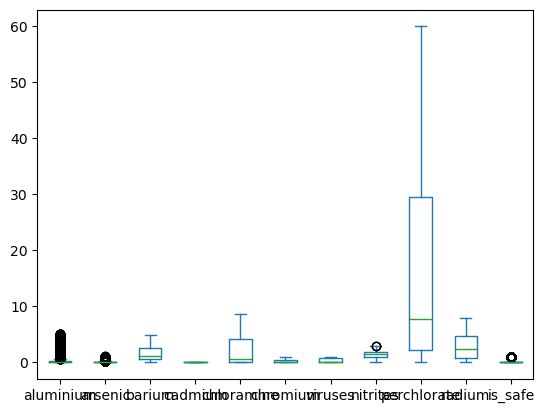

In [138]:
data.plot.box()

In [ ]:
'''
# Data Visualization
# Standardizing the variables
import seaborn as sns
def plot_confusion_matrix(cm, classes=None, title='Confusion matrix'):
    if classes is not None:
        sns.heatmap(cm, xticklabels=classes, yticklabels=classes, vmin=0., vmax=1., annot=True, annot_kws={'size':50})
    else:
        sns.heatmap(cm, vmin=0., vmax=1.)
    plt.title(title)
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
'''

In [139]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
scaler.fit(data.drop('is_safe',axis=1))
scaled_feature = scaler.transform(data.drop('is_safe',axis=1))
df_feat = pd.DataFrame(scaled_feature,columns = data.columns[:-1])
df_feat.head()


,aluminium,arsenic,barium,cadmium,chloramine,chromium,viruses,nitrites,perchlorate,radium
0,0.777403,-0.480875,1.054205,-0.993241,-0.711941,2.152993,-0.869387,-0.348629,1.203362,1.661842
1,1.306945,-0.599632,1.432447,-1.131948,1.208552,1.598765,0.849782,1.046960,0.892977,0.124811
2,0.271572,-0.480875,-0.812340,-0.965499,0.803417,1.044536,-0.861452,-0.383518,1.911763,1.786699
3,0.548198,-0.480875,1.144654,-1.159690,1.968179,-0.802892,1.008475,-0.069511,-0.415275,-0.516695
4,0.200439,-0.520460,-1.124801,-1.020982,0.191820,1.635713,-0.866742,-0.383518,0.024578,-0.219622


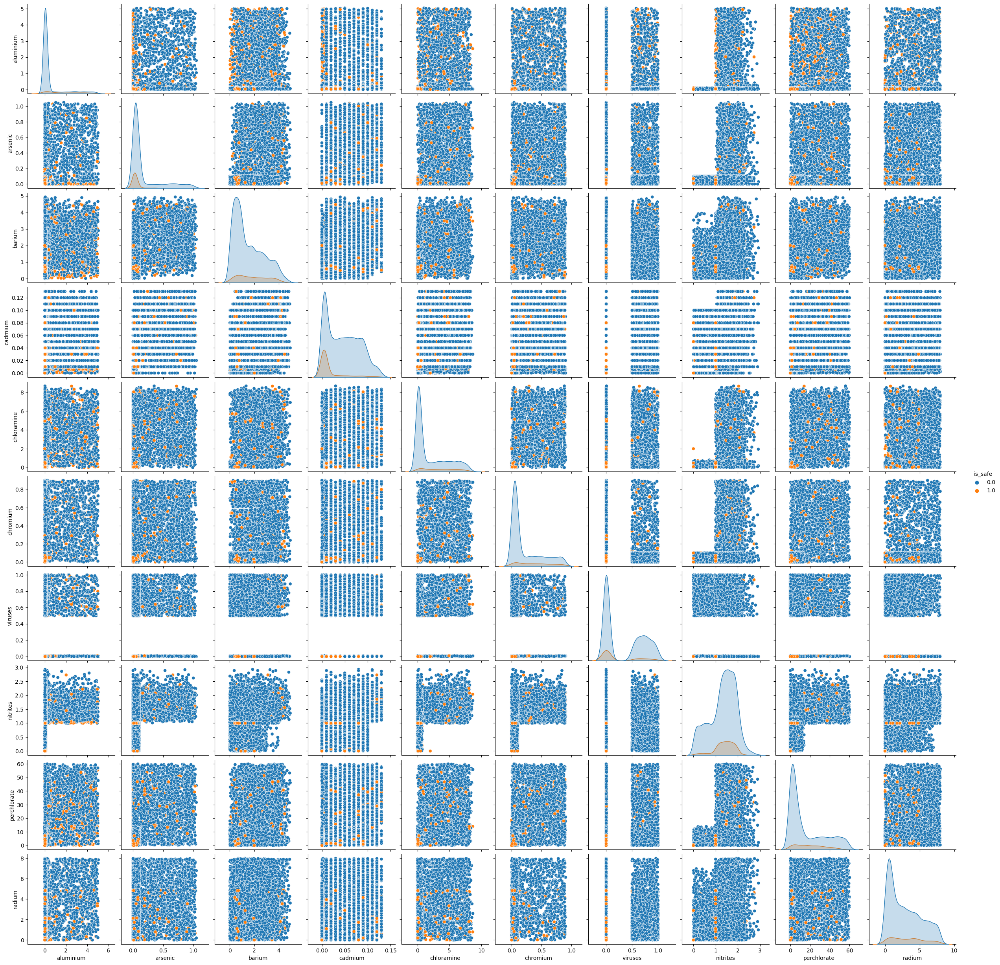

In [140]:
# Pair plot
import seaborn as sns
sns.pairplot(data,hue='is_safe')

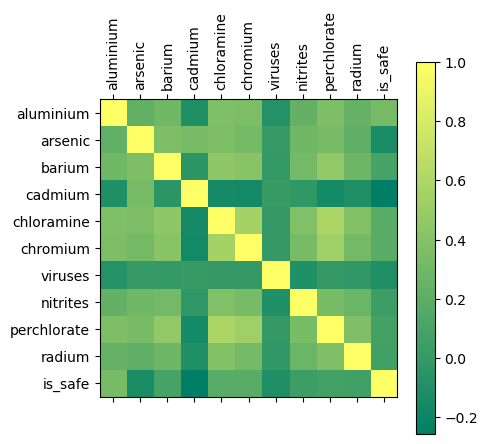

In [141]:
plt.matshow(data.corr(),cmap='summer')
plt.colorbar()
plt.xticks(list(range(len(data.columns))),data.columns,rotation='vertical')
plt.yticks(list(range(len(data.columns))),data.columns,rotation='horizontal')
plt.show()

<AxesSubplot:xlabel='aluminium', ylabel='is_safe'>

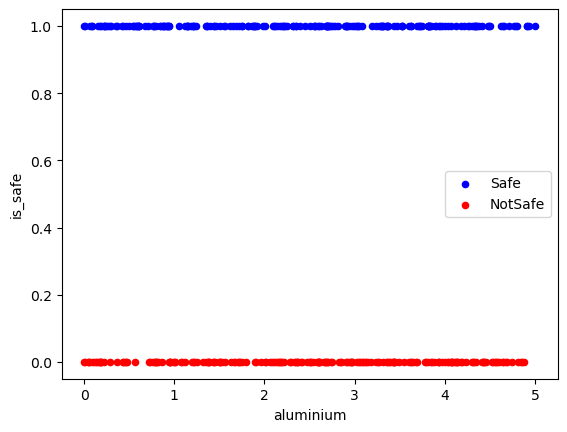

In [143]:
# With Above matrix we can see Aluminium having the highest correlation with the Target Variable
# Count plot for Dependent Feature
not_safe = data[data['is_safe']==0][0:200]
safe = data[data['is_safe']==1][0:200]
axes = safe.plot(kind ='scatter', x = 'aluminium', y ='is_safe', color= 'blue', label= 'Safe')
not_safe.plot(kind ='scatter', x = 'aluminium', y ='is_safe', color= 'red', label= 'NotSafe', ax = axes)
# Count plot for Dependent Feature

<AxesSubplot:xlabel='is_safe', ylabel='count'>

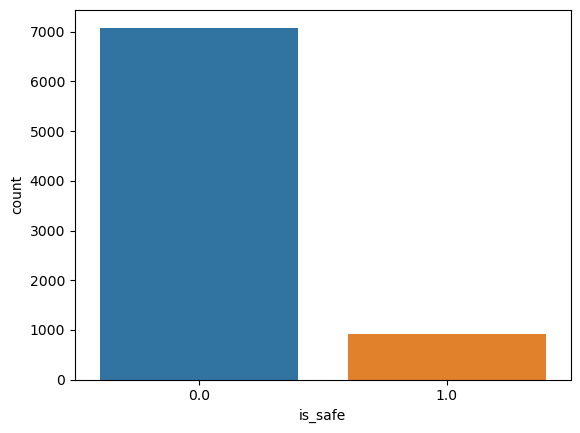

In [144]:
sns.countplot(x='is_safe', data= data)

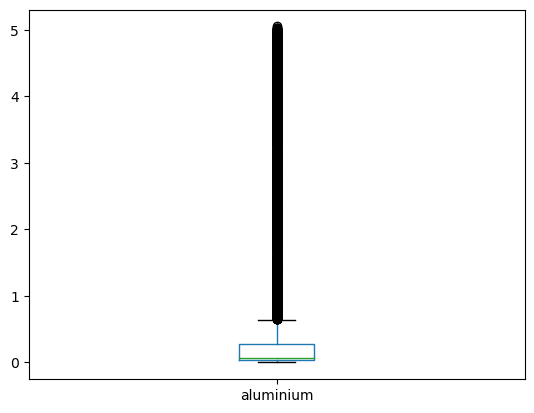

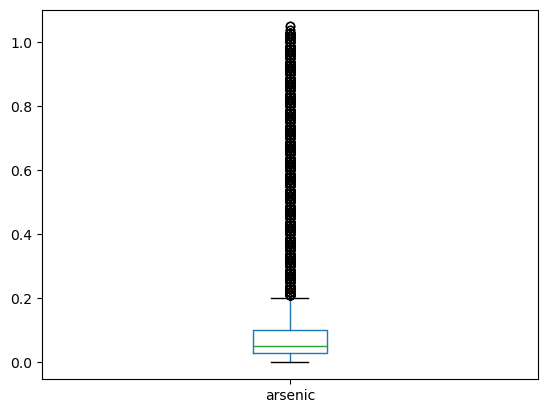

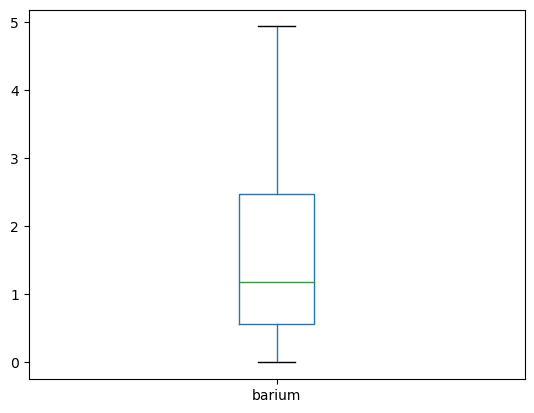

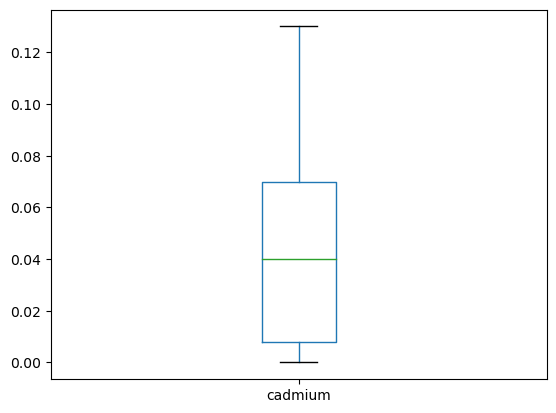

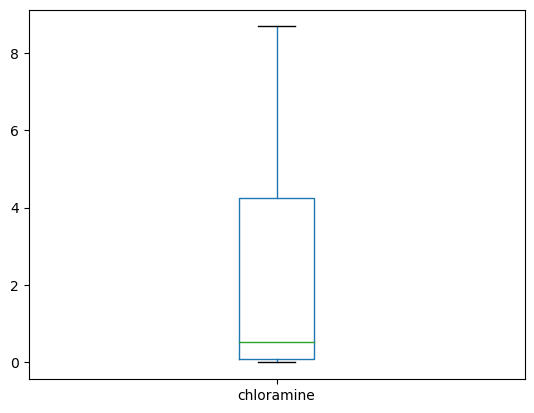

...

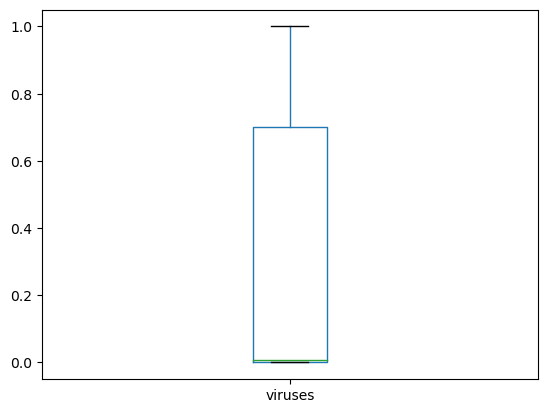

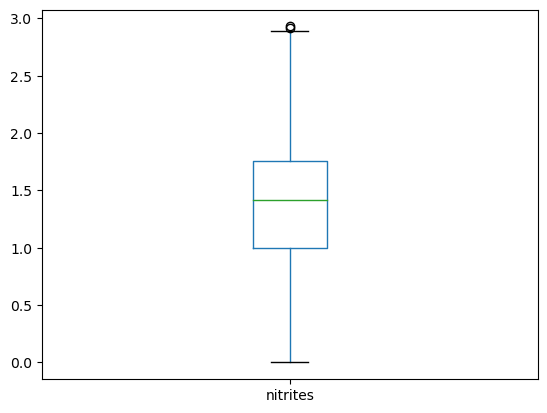

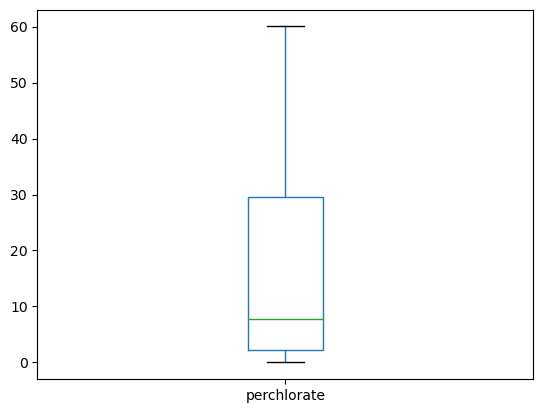

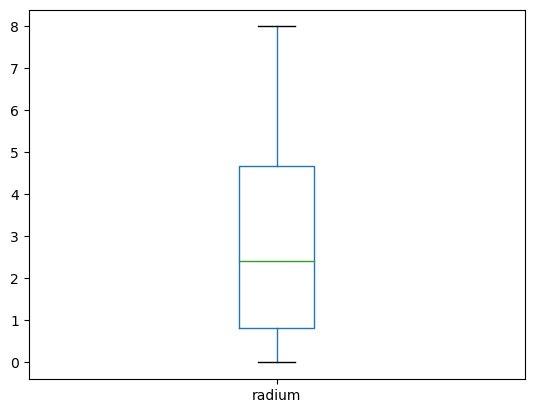

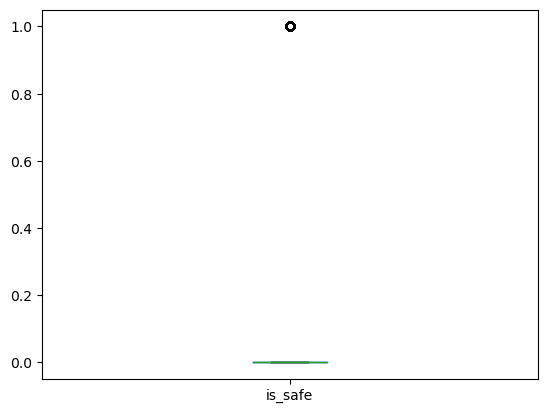

In [145]:
# Checking For Outliers
for feature in data.columns:
    plot_boxplot(data, feature)

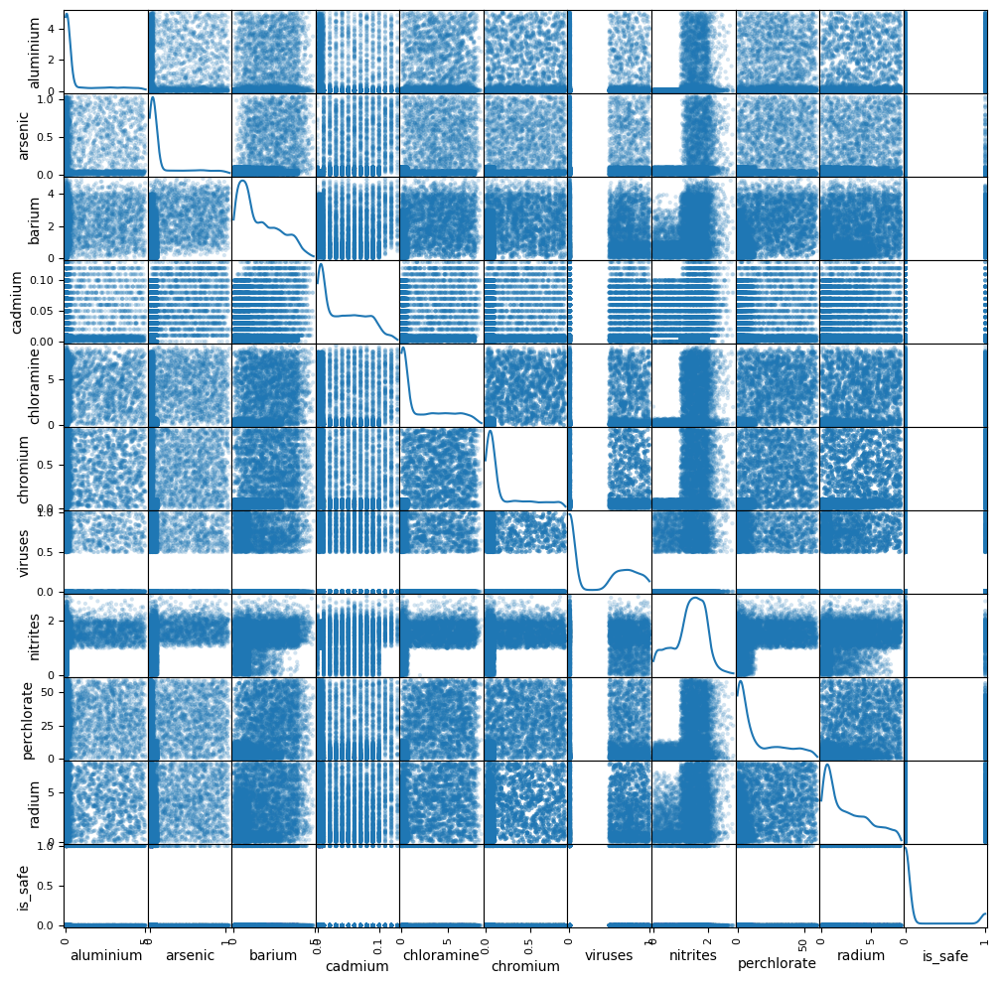

In [146]:
# Checking theCovariance between each attribute. Covariance indicates the relationship of two variables whenever one
# variable changes.
pd.plotting.scatter_matrix(data, alpha =0.2 , figsize=(12,12), diagonal = 'kde')
plt.show()

In [ ]:
'''
Supervised / Unsupervised Learning Algorithms
Since we are trying to implement a classification model i narrowed down to first by just Testing the Accuracy
with Logistic Regression, And then finally Narrowing down to Three Algorithms SVM , Decision Tree and
Random Forest classifier.

SVM: Support Vector Machine or SVM is one of the most popular Supervised Learning algorithms, which is used
for Classifi cation as well as Regression problems. However, primarily, it is used for Classifi cation problems in
Machine Learning. The goal of the SVM algorithm is to create the best line or decision boundary that can
segregate n-dimensional space into classes so that we can easily put the new data point in the correct category
in the future. This best decision boundary is called a hyperplane. SVM chooses the extreme points/vectors that
help in creating the hyperplane. These extreme cases are called as support vectors, and hence algorithm is
termed as Support Vector Machine. SVM is very helpful method if we don’t have much idea about the data.It can
be used for the data that is not regularly distributed and have unknown distribution. It can be used for the data
such as image, text, audio etc. Since we are trying out to classify images we have a good algorithm to
implement in SVM

Decision Tree: Decision Trees (DTs) are a non-parametric supervised learning method used for classifi cation
and regression. The goal is to create a model that predicts the value of a target variable by learning simple
decision rules inferred from the data features. A tree can be seen as a piecewise constant approximation. The
mains advantages that Decision Tree holds is that it is easy to understand and interpret and the trees can be
visualised.

Random Forest Classifier: A random forest is a machine learning technique that’s used to solve regression and
classification problems. A random forest algorithm consists of many decision trees. The ‘forest’ generated by
the random forest algorithm is trained through bagging or bootstrap aggregating.The (random forest) algorithm
establishes the outcome based on the predictions of the decision trees. It predicts by taking the average or
mean of the output from various trees. Increasing the number of trees increases the precision of the outcome.
Python Packages

numpy: NumPy, which stands for Numerical Python, is a library consisting of multidimensional array objects and
a collection of routines for processing those arrays. Using NumPy, mathematical and logical operations on
arrays can be performed.

pandas: Pandas is an open source library in Python. It provides ready to use high-performance data structures
and data analysis tools. import seaborn as sn

matplotlib.pyplot: matplotlib.pyplot is a plotting library used for 2D graphics in python programming language. It
can be used in python scripts, shell, web application servers and other graphical user interface toolkits.
Matploitlib is a Python Library used for plotting, this python library provides and objected-oriented APIs for
integrating plots into applications

seaborn :seaborn is a data visualization library built on top of matplotlib and closely integrated with pandas data
structures in Python. Visualization is the central part of Seaborn which helps in exploration and understanding of
data.

sklearn: Scikit-learn is probably the most useful library for machine learning in Python. The sklearn library
contains a lot of effi cient tools for machine learning and statistical modeling including classifi cation,
regression, clustering and dimensionality reduction.
'''

In [147]:
# Testing Out Accuracy Using Logistic regression
# Splitting The DataSet to Training ans Test
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
X = data.iloc[:,0:9]
y = data.iloc[:,-1]
X_train , X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)


In [148]:
# LogisticRegression: this is imported from sklearn.linear_model. Used for performing logistic regression Here I
# will create a LogistiRegression object and fit it with out dataset.
from sklearn.linear_model import LogisticRegression
logReg_classifier = LogisticRegression(solver='lbfgs', max_iter=1000)
logReg_classifier.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

accuracy is:-  0.90125
confusion matrix is:- 
 [[1401   20]
 [ 138   41]]
percentage of confusion matrix is:- 
 [[0.9859254  0.0140746 ]
 [0.77094972 0.22905028]]


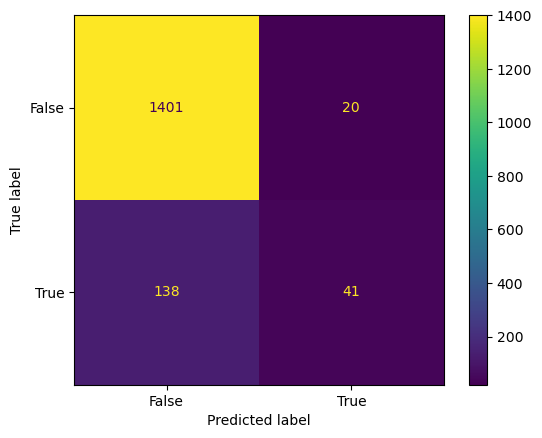

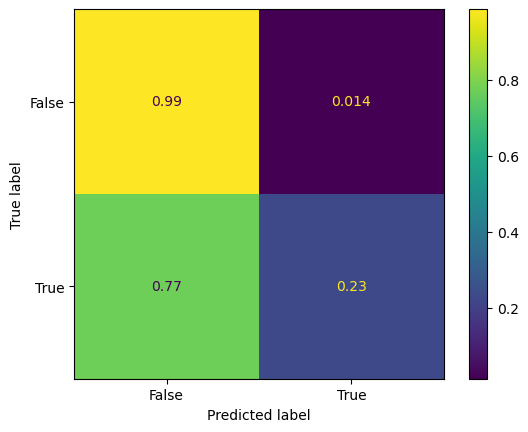

In [171]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
# Making prediction using the model
y_pred = logReg_classifier.predict(X_test)
# Evaluating The Model Checking the Accuracy and Performence Using Confusion Matrix
print('accuracy is:- ',accuracy_score(y_test,y_pred))
cm = confusion_matrix(y_test, y_pred)
print('confusion matrix is:- \n',cm)
cm_norm = cm/cm.sum(axis=1)[:, np.newaxis]
print('percentage of confusion matrix is:- \n',cm_norm)
confusion_matrix = metrics.confusion_matrix(y_test, y_pred)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()
confusion_matrix = confusion_matrix/confusion_matrix.sum(axis=1)[:, np.newaxis]
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

In [150]:
# Supervised learning Algorithm - SVM using scikit-learn
# Distribution of the classes Using Scatter Plot
data['is_safe'].value_counts()

0.0    7084
1.0     912
Name: is_safe, dtype: int64

<AxesSubplot:xlabel='aluminium', ylabel='perchlorate'>

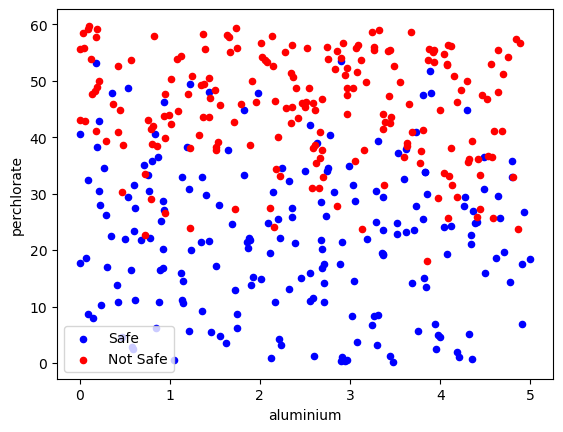

In [151]:
not_safe = data[data['is_safe']==0][0:200]
safe = data[data['is_safe']==1][0:200]
axes = safe.plot(kind ='scatter', x = 'aluminium', y ='perchlorate', color= 'blue', label= 'Safe')
not_safe.plot(kind ='scatter', x = 'aluminium', y ='perchlorate', color= 'red', label= 'Not Safe', ax = axes)


In [152]:
# Splitting dataset into train and test
from sklearn.model_selection import train_test_split
from sklearn import svm
X = data.iloc[:,0:9]
y = data.iloc[:,-1]
X_train , X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)
classifier = svm.SVC(kernel = 'linear', gamma = 'auto', C=2)
classifier.fit(X_train, y_train)

SVC(C=2, gamma='auto', kernel='linear')

In [153]:
y_predict = classifier.predict(X_test)
# Evaluating The results
accuracy_score(y_test,y_predict)


0.90375

[[1388   33]
 [  95   84]]


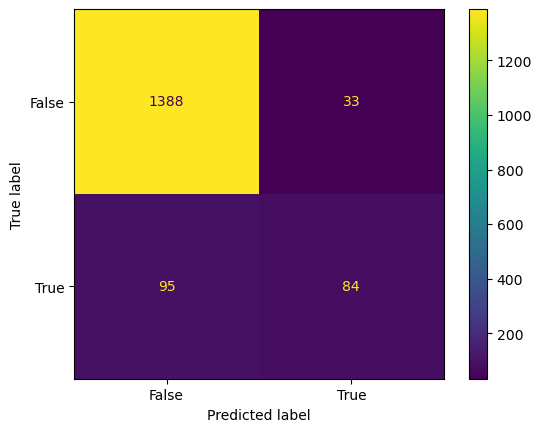

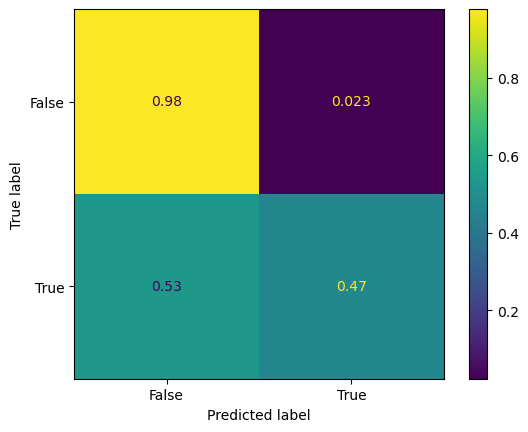

              precision    recall  f1-score   support

         0.0       0.94      0.98      0.96      1421
         1.0       0.72      0.47      0.57       179

    accuracy                           0.92      1600
   macro avg       0.83      0.72      0.76      1600
weighted avg       0.91      0.92      0.91      1600



In [174]:
from sklearn import metrics
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt
print(confusion_matrix(y_test,y_predict))
confusion_matrix = metrics.confusion_matrix(y_test, y_predict)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()
confusion_matrix = confusion_matrix/confusion_matrix.sum(axis=1)[:, np.newaxis]
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()
print(classification_report(y_test, y_predict))


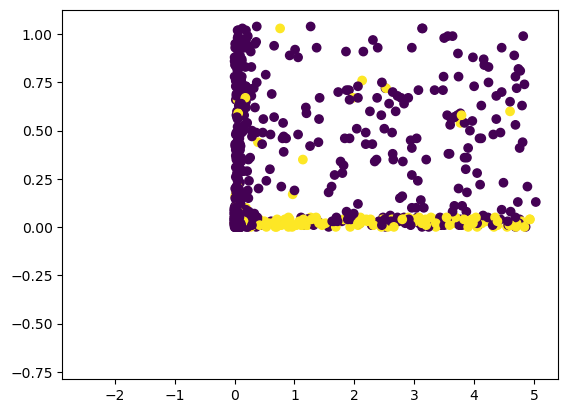

In [155]:
plt.scatter(X_test.iloc[:,0] , X_test.iloc[:,1],c=y_test)
w = classifier.coef_[0]
a = -w[0] / w[1]
xx = np.linspace(-2.5,-2.5)
yy = a* xx - (classifier.intercept_[0] / w[1])
plt.plot(xx,yy)
plt.axis("on"), plt.show();


In [156]:
# Using Radial basis function kernel
# The RBF kernel on two samples x and x', represented as feature vectors in some input space, is defined as:
classifier_rbf = svm.SVC(kernel = 'rbf', gamma = 'auto', C=10)
classifier_rbf.fit(X_train, y_train)
y_predict = classifier_rbf.predict(X_test)
accuracy_score(y_test,y_predict)

0.92

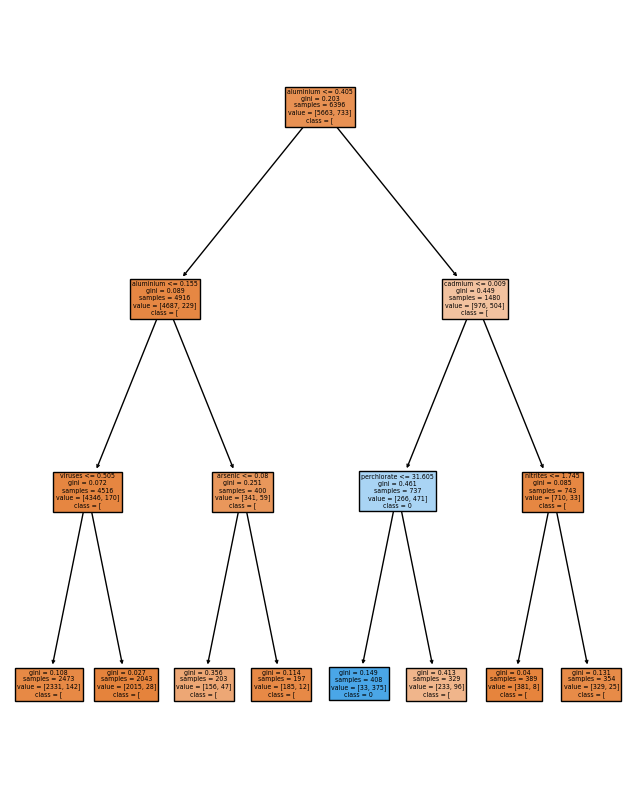

Accuracy is  93.875


In [158]:
'''
Supervised learning Algorithm - Decision Trees
Decision Trees are a supervised learning method used for classification and regression
How it works:
The ID3 algorithm begins with the original set {S} S as the root node
On each iteration of the algorithm, it iterates through every unused attribute of the set and calculates the
entropy (or -- information gain) of that attribute
It then selects the attribute which has the smallest entropy (or largest information gain) value.
The set is then split by the selected attribute to produce subsets of the data.
The algorithm continues to recurse on each subset, considering only attributes never selected before.
'''
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn import tree
import matplotlib.pyplot as plt
feature_names=data.columns
labels = y_train.unique()
clf_gini = DecisionTreeClassifier(criterion = "gini", random_state = 100,max_depth=3, min_samples_leaf=5)
clf_gini.fit(X_train, y_train)

fig = plt.figure(figsize=(8,10))
_ = tree.plot_tree(clf_gini, feature_names=feature_names,class_names=str(labels),filled=True)
plt.show()
y_pred=clf_gini.predict(X_test)
print("Accuracy is ", accuracy_score(y_test,y_pred)*100)


In [160]:
'''
Random forest Algorithm Using SKLearn
Random forest is an ensemble classifier that consists of many decision trees and outputs the class that is
the mode of the class's output by individual trees.
Takes the average (entropy/information gain) of many Decision Trees via bagging.
Bagging is short for “bootstrap aggregation,” meaning that samples are chosen with replacement
(bootstrapping), and combined (aggregated) by taking their average
'''
#Splitting the DataSet
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
X = data.iloc[:,0:9]
y = data.iloc[:,-1]
X_train , X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=4)

In [161]:
rf_classifier = RandomForestClassifier(n_estimators=100, criterion='entropy')
rf_classifier.fit(X_train, y_train)
prediction_test = rf_classifier.predict(X=X_test)
#Accuracy on Training Data
print("Training Accuracy is: ", rf_classifier.score(X_train, y_train))

Training Accuracy is:  1.0


Testing Accuracy is:  0.940625


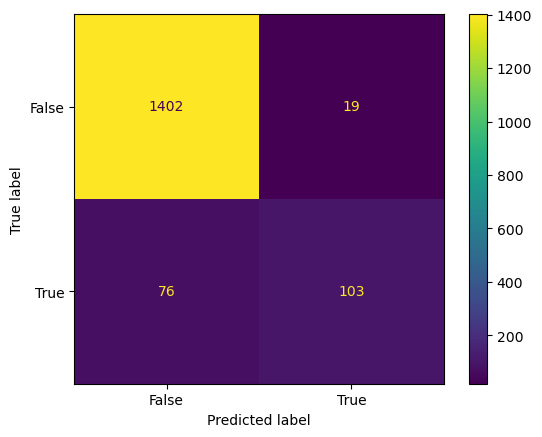

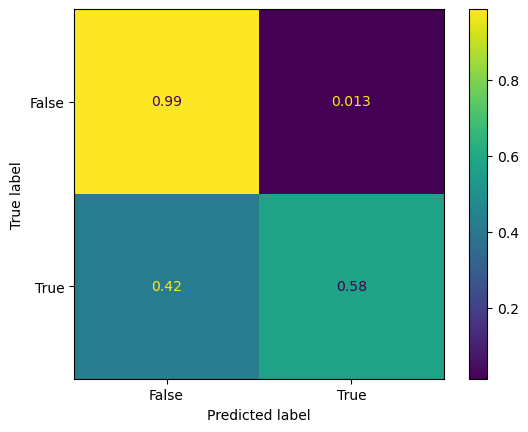

In [162]:
# Accuracy on Testing data
from sklearn import metrics
from sklearn.metrics import confusion_matrix
print("Testing Accuracy is: ", rf_classifier.score(X_test, y_test))
# Plotting the confusion matrix
cm=confusion_matrix(y_test, prediction_test)
cm_norm = cm/cm.sum(axis=1)[:, np.newaxis]
confusion_matrix = metrics.confusion_matrix(y_test, prediction_test)
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()
confusion_matrix = confusion_matrix/confusion_matrix.sum(axis=1)[:, np.newaxis]
cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
cm_display.plot()
plt.show()

Classification accuracy on test set with max features = 1 and max_depth = None:0.939


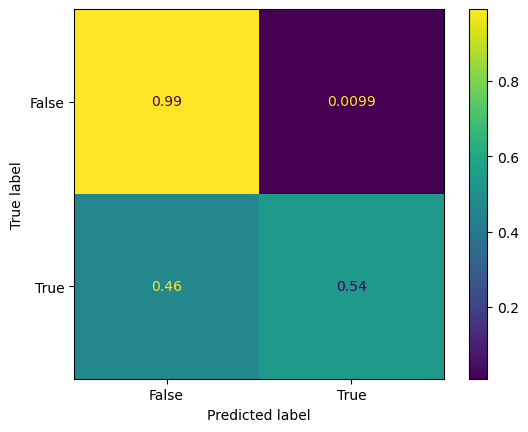

Classification accuracy on test set with max features = 1 and max_depth = 2:0.888


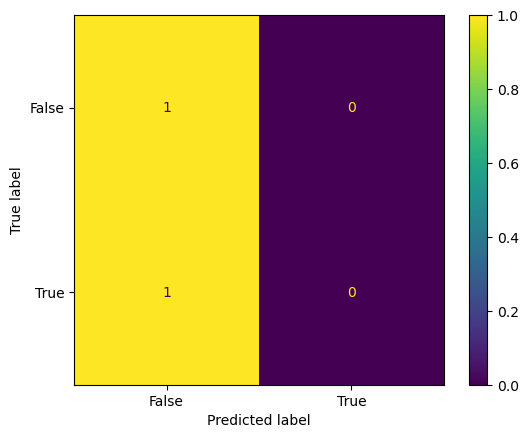

Classification accuracy on test set with max features = 1 and max_depth = 3:0.888


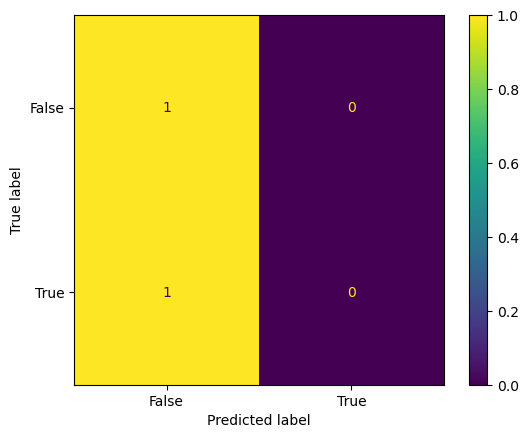

Classification accuracy on test set with max features = 1 and max_depth = 4:0.888


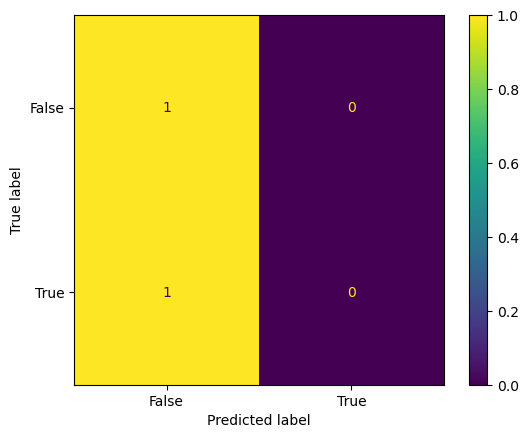

Classification accuracy on test set with max features = 1 and max_depth = 5:0.896


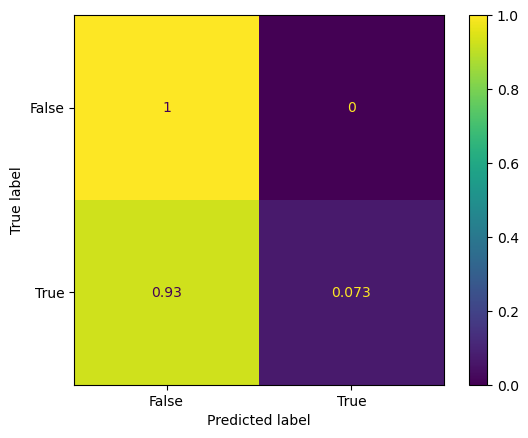

Classification accuracy on test set with max features = sqrt and max_depth = None:0.943


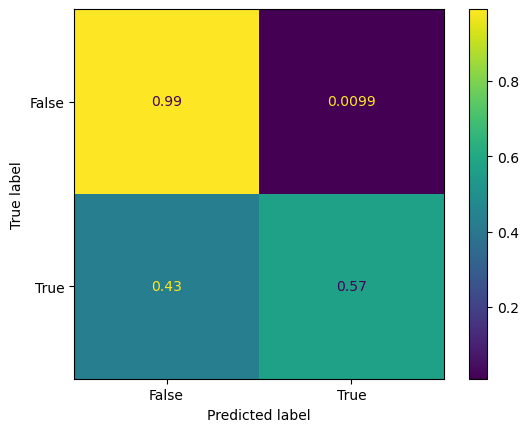

Classification accuracy on test set with max features = sqrt and max_depth = 2:0.888


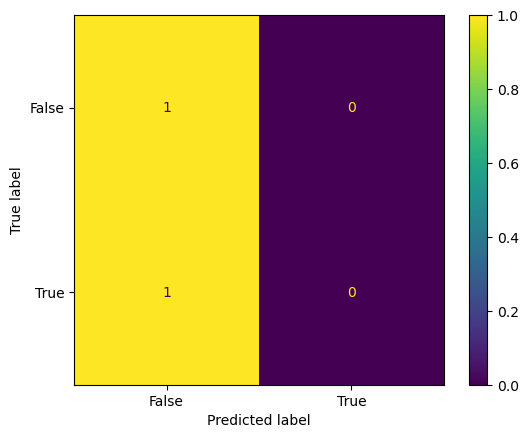

Classification accuracy on test set with max features = sqrt and max_depth = 3:0.938


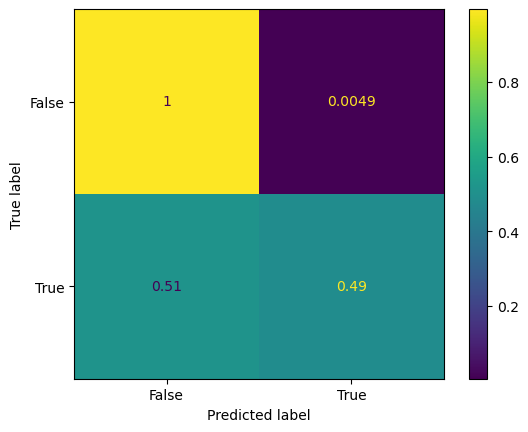

Classification accuracy on test set with max features = sqrt and max_depth = 4:0.941


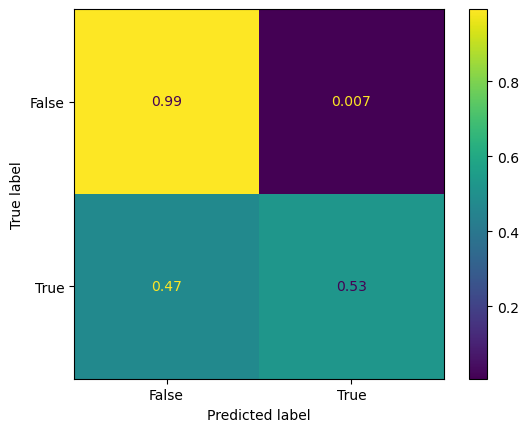

Classification accuracy on test set with max features = sqrt and max_depth = 5:0.942


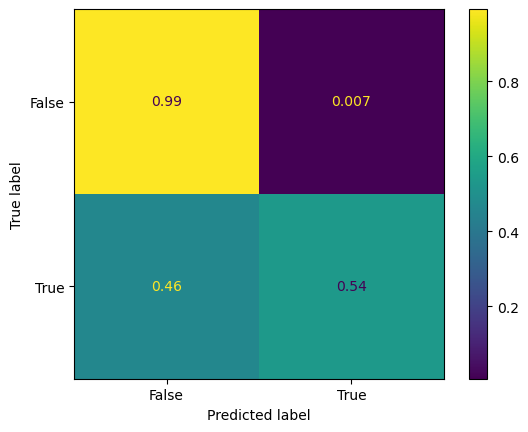

Classification accuracy on test set with max features = log2 and max_depth = None:0.943


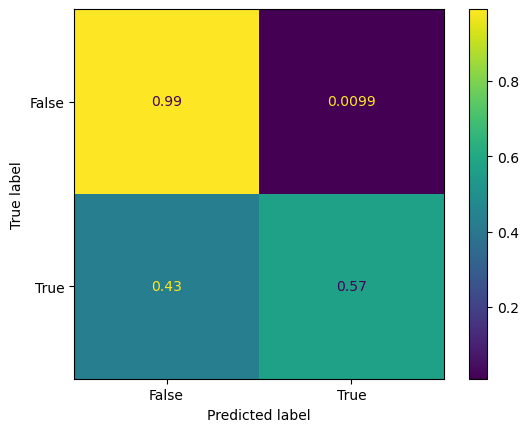

Classification accuracy on test set with max features = log2 and max_depth = 2:0.888


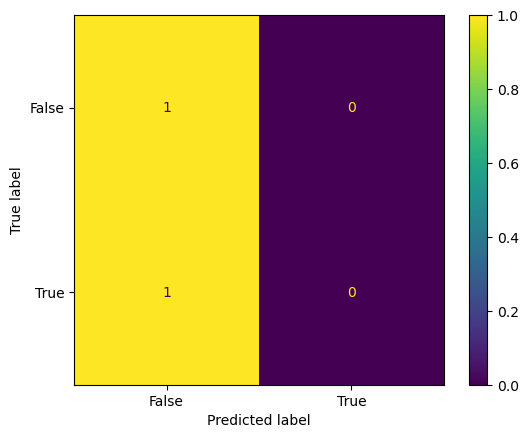

Classification accuracy on test set with max features = log2 and max_depth = 3:0.938


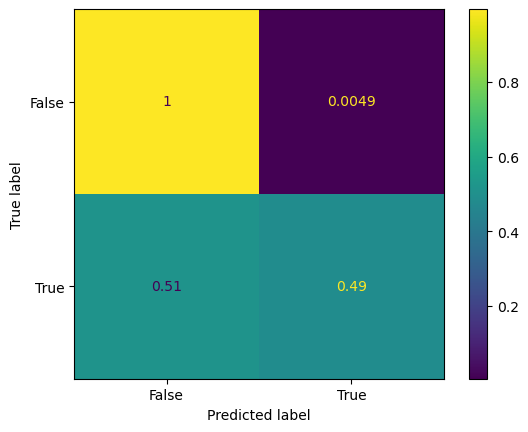

Classification accuracy on test set with max features = log2 and max_depth = 4:0.941


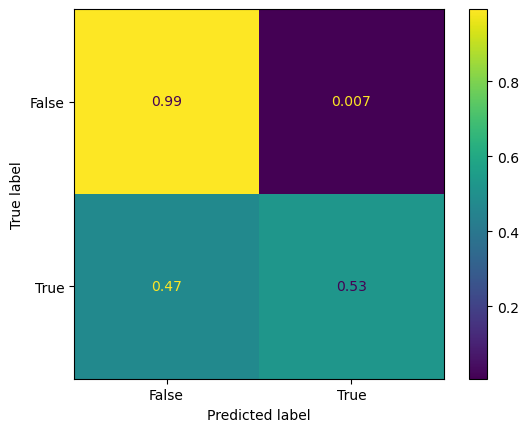

Classification accuracy on test set with max features = log2 and max_depth = 5:0.942


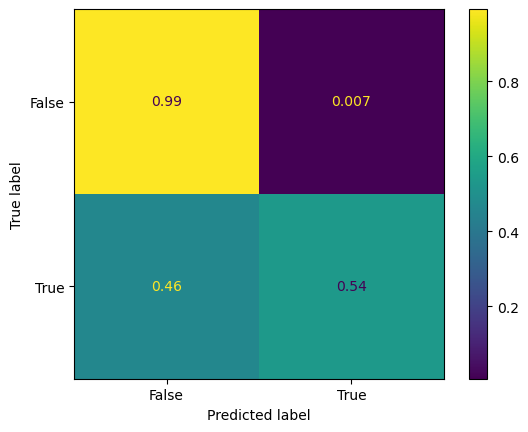

In [163]:
from itertools import product
from sklearn import metrics
from sklearn.metrics import confusion_matrix
import mlxtend
n_estimators = 100
max_features = [1, 'sqrt', 'log2']
max_depths = [None, 2, 3, 4, 5]
for f, d in product(max_features, max_depths): # with product we can iterate through all possible combinations
    rf_classifier = RandomForestClassifier(n_estimators=n_estimators,criterion='entropy',max_features=f,max_depth=d,
                                           n_jobs=2,random_state=1337)
    rf_classifier.fit(X_train, y_train)
    prediction_test = rf_classifier.predict(X=X_test)
    print('Classification accuracy on test set with max features = {} and max_depth = {}:{:.3f}'.format(f, d, accuracy_score(y_test,prediction_test)))
    confusion_matrix = metrics.confusion_matrix(y_test, prediction_test)
    confusion_matrix = confusion_matrix/confusion_matrix.sum(axis=1)[:, np.newaxis]
    cm_display = metrics.ConfusionMatrixDisplay(confusion_matrix = confusion_matrix, display_labels = [False, True])
    cm_display.plot()
    plt.show()

In [101]:
import mlxtend

0.21.0
